## Discriminative Correlation Filter

1) Load image: img

2) Select region: p_img

    1) Reshape to 1-D array: p
    2) FFT: P

3) Create Desired Response, Multivariable Guassian 

    

(array([ 99,  99, 100, 100], dtype=int64), array([49, 50, 49, 50], dtype=int64))
(20000, 1)
(360, 480, 3)
49.5
99.5
[ 99  99 100 100]
(array([ 99,  99, 100, 100], dtype=int64), array([49, 50, 49, 50], dtype=int64))


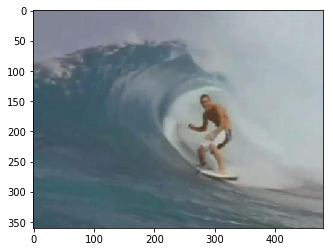

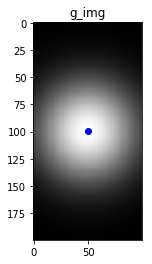

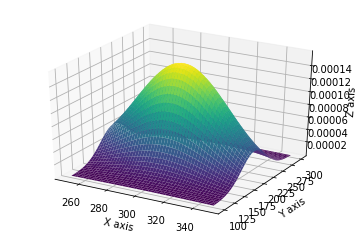

In [94]:
import numpy as np
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
import cv2

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

def pre_process(img):
    # Get size of image
    h, w = img.shape
    # Transform pixel values using log function which helps with low contrast lightning
    img = np.log(img + 1)
    # The pixels are normalized to have a mean of 0.0 and norm of 1.
    img = (img - np.mean(img)) / np.std(img)
    # Finally the image is mulitplied by a consine window which gradually reduce the pixel values near the edge to zero.
    return img * window_func_2d(h, w)

def window_func_2d(height, width):
    win_col = np.hanning(width)
    win_row = np.hanning(height)
    mask_col, mask_row = np.meshgrid(win_col, win_row)
    win = mask_col * mask_row
    return win

# Entire image
img_path = 'C:/git/Object Tracking/datasets/surfer/0001.jpg'
img = mpimg.imread(img_path)
plt.figure()
plt.imshow(img)

# Features, Training example P
center_x = 300
center_y = 200
width = 100
height = 200
p_img = img[center_y-int(height/2):center_y+int(height/2),center_x-int(width/2):center_x+int(width/2)]
p_img = rgb2gray(p_img)

p_img = pre_process(p_img)

plt.figure()
plt.imshow(p_img, cmap = plt.get_cmap('gray'))

p = p_img.reshape(-1,1) # reshape to a singel row
P = np.fft.fft(p)

# Create Desired Responses, Feature * Filters = Responses

#Parameters to set
mu_x = center_x 
variance_x = height
mu_y = center_y
variance_y = width

#Create grid and multivariate normal
y = np.linspace(center_y-int(height/2),center_y+int(height/2),p_img.shape[0])
x = np.linspace(center_x-int(width/2),center_x+int(width/2),p_img.shape[1])

X, Y = np.meshgrid(x,y)
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X 
pos[:, :, 1] = Y

sigma = np.array([[variance_y, 0],[0, variance_x]])
mu = np.array([[mu_y], [mu_x]])

r = multivariate_normal([mu_x, mu_y], [[1000, 0], [0, 1000]])
g_img = r.pdf(pos)
g_1 = g_img.reshape(-1,1)
max_value = np.max(g_img)
max_pos = np.where(g_img == max_value)
print(max_pos)
print(g_1.shape)
print(img.shape)

plt.imshow(g_img, cmap = plt.get_cmap('gray'))
plt.title('g_img')
print(np.median(max_pos[1]))
print(np.median(max_pos[0]))
print(max_pos[0])
print(max_pos)
plt.plot(np.median(max_pos[1]), np.median(max_pos[0]), 'bo')
plt.show()

#Make a 3D plot
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, g_img,cmap='viridis',linewidth=0)
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
plt.show()

In [ ]:
img.reshape(-1,1).size

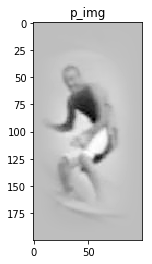

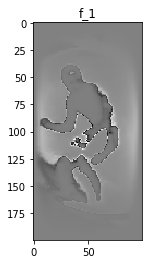

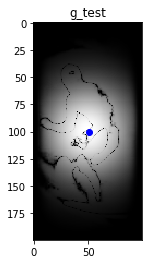

(array([100], dtype=int64), array([51], dtype=int64))


In [95]:
# TEST

# Filter
l = 0.001
A = np.fft.fft(g_1) * np.conjugate(P)
B = P * np.conjugate(P)
F_1 = A / (B + l)
f_1 = np.real(np.fft.ifft(np.conjugate(F_1)))

plt.figure()
plt.imshow(p.reshape(p_img.shape), cmap = plt.get_cmap('gray'))
plt.title('p_img')
plt.show()

plt.figure()
plt.imshow(f_1.reshape(p_img.shape), cmap='gray')
plt.title("f_1")
plt.show()

plt.figure()
G_test = F_1 * P
g_test = np.real(np.fft.ifft(G_test))
g_test = g_test.reshape(g_img.shape)

max_value = np.max(g_test)
max_pos = np.where(g_test == max_value)
plt.imshow(g_test, cmap = plt.get_cmap('gray'))
plt.title('g_test')
plt.plot(max_pos[1], max_pos[0], 'bo')
plt.show()

max_value = np.max(g_test)
max_pos = np.where(g_test == max_value)
print(max_pos)

Iteration: 0
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

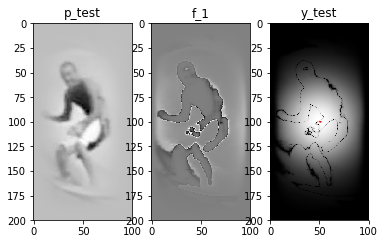

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



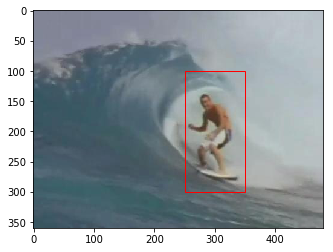

Iteration: 1
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

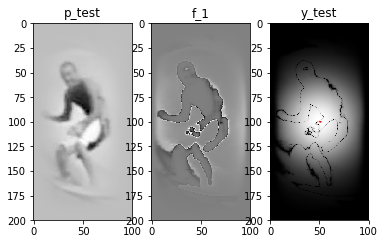

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



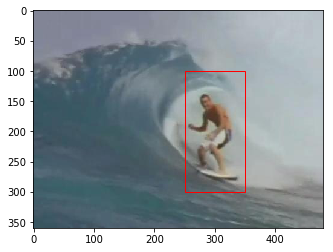

Iteration: 2
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

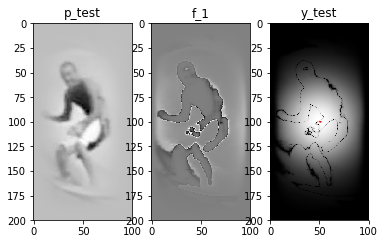

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



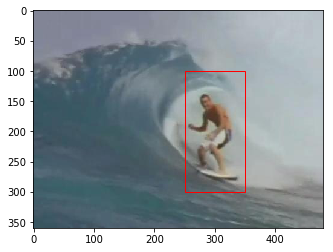

Iteration: 3
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

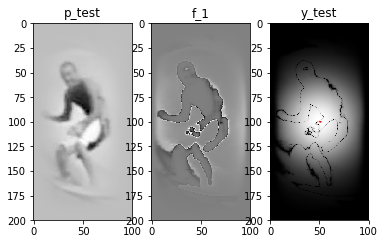

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



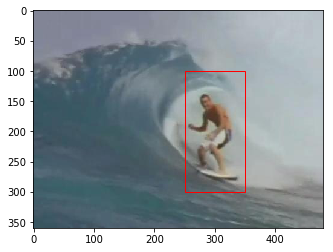

Iteration: 4
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

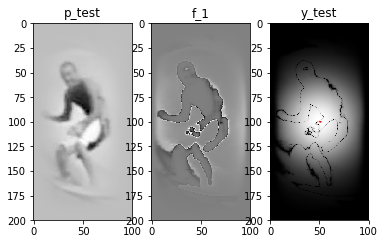

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



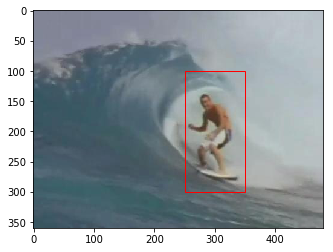

Iteration: 5
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

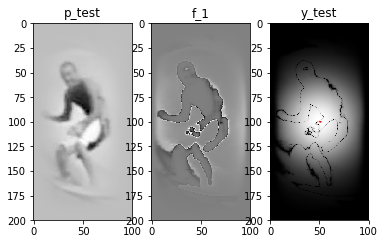

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



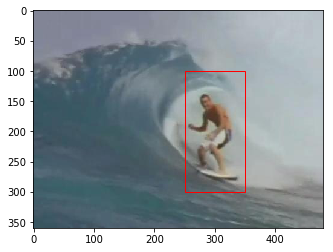

Iteration: 6
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

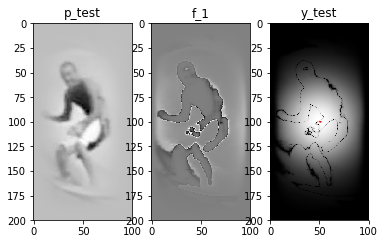

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



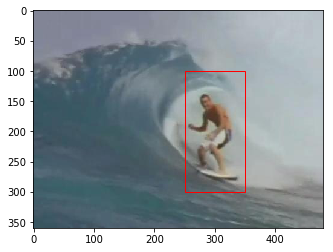

Iteration: 7
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

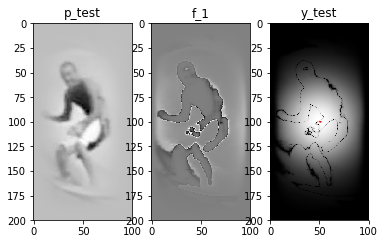

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



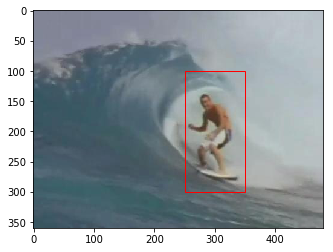

Iteration: 8
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

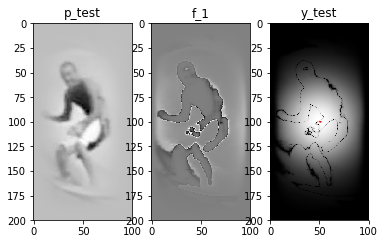

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



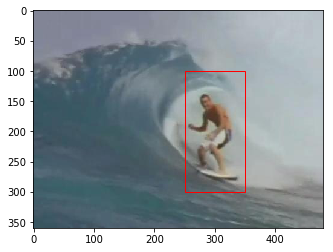

Iteration: 9
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

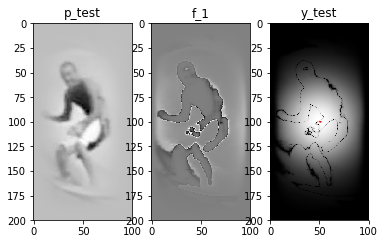

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



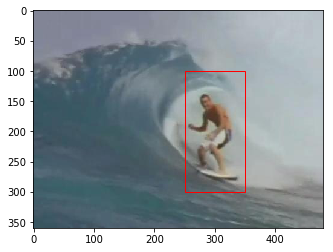

Iteration: 10
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

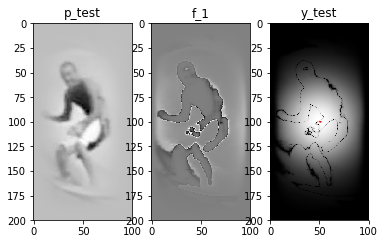

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



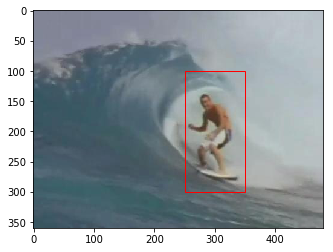

Iteration: 11
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

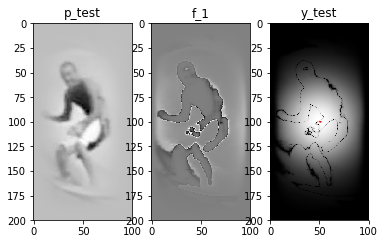

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



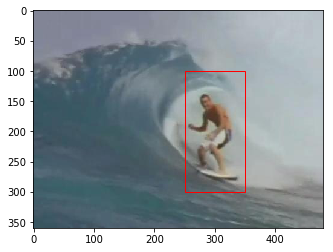

Iteration: 12
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

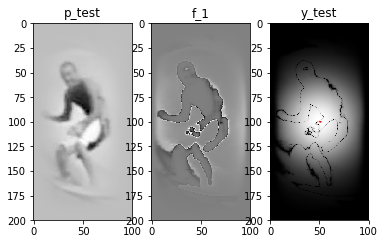

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



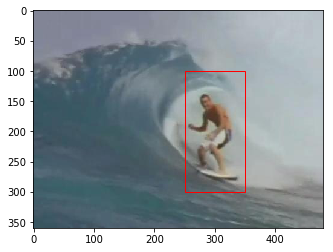

Iteration: 13
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

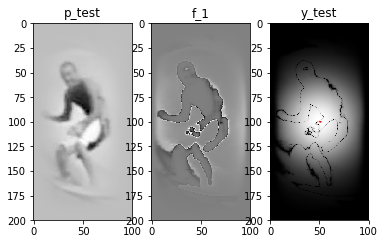

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



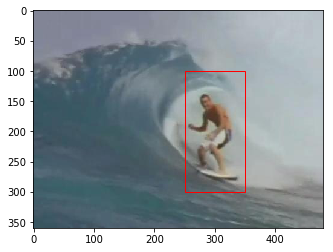

Iteration: 14
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

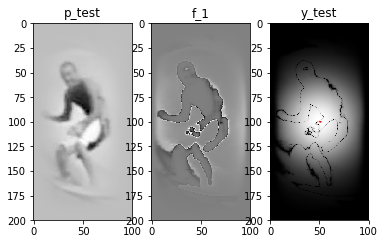

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



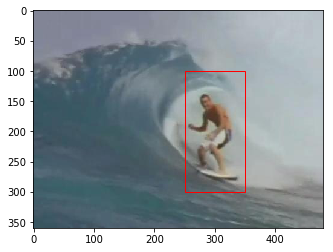

Iteration: 15
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

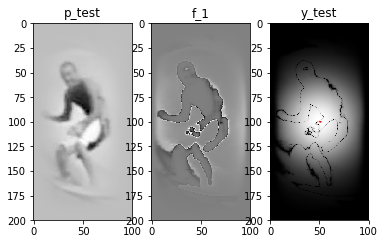

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



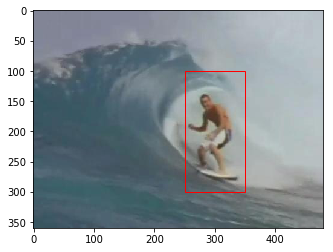

Iteration: 16
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

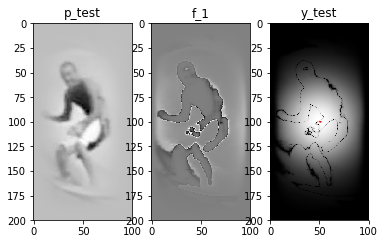

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



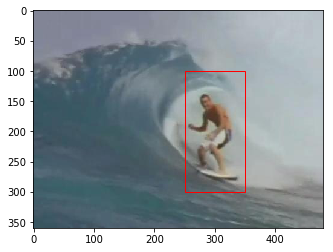

Iteration: 17
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

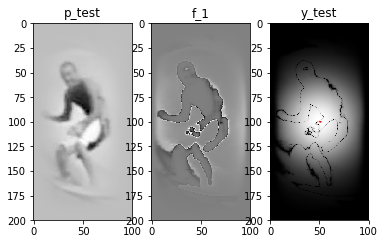

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



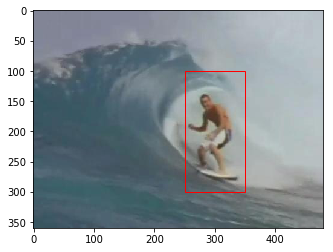

Iteration: 18
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

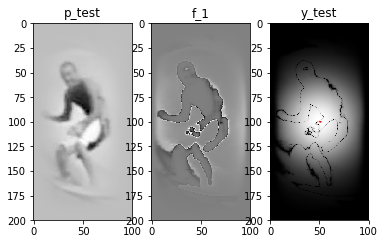

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



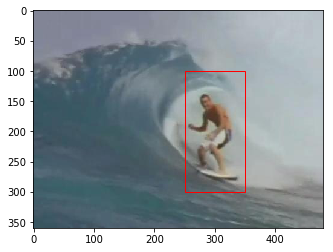

Iteration: 19
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

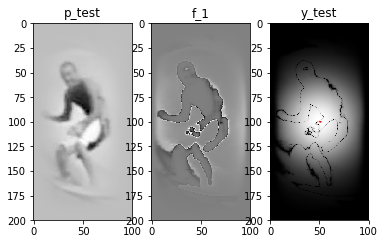

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



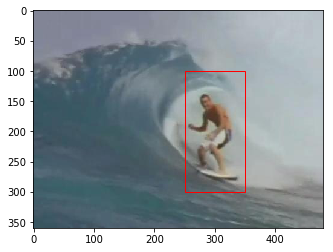

Iteration: 20
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

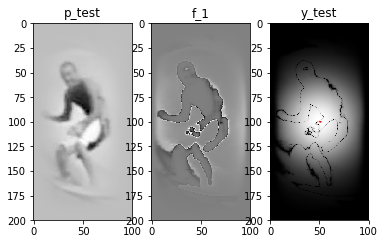

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



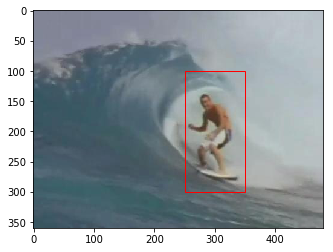

Iteration: 21
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

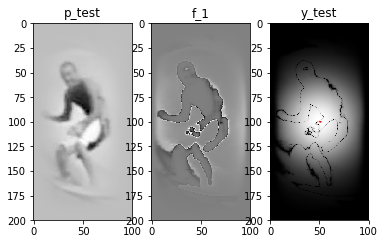

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



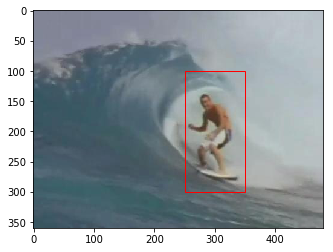

Iteration: 22
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

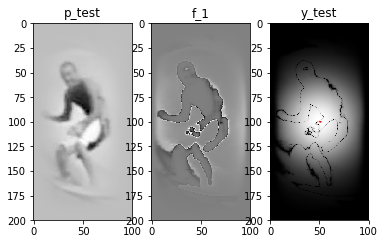

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



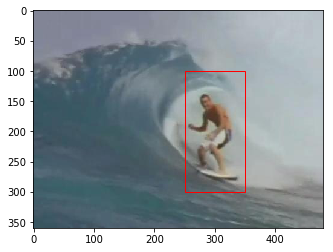

Iteration: 23
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

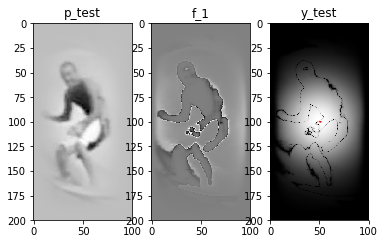

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



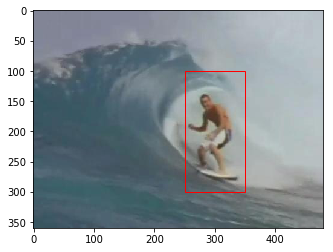

Iteration: 24
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

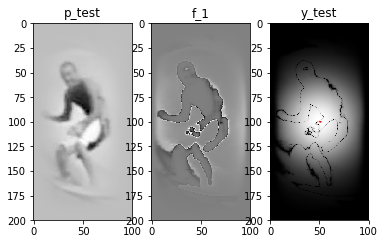

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



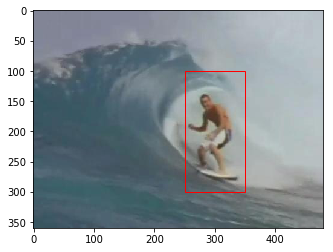

Iteration: 25
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

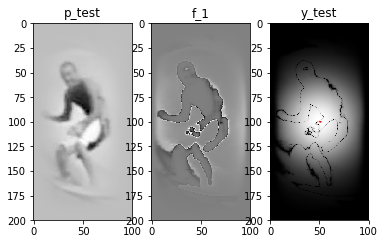

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



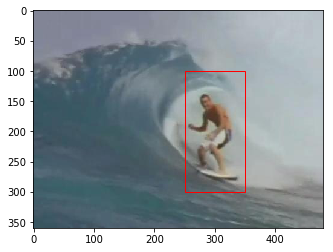

Iteration: 26
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

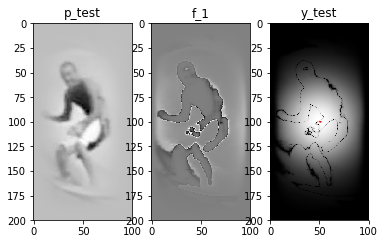

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



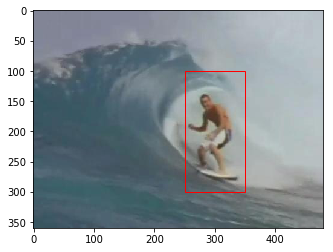

Iteration: 27
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

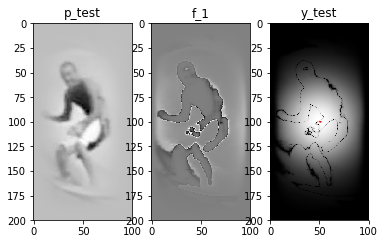

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



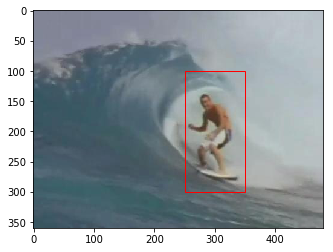

Iteration: 28
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

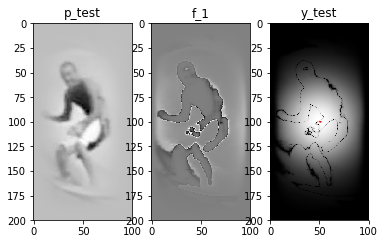

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



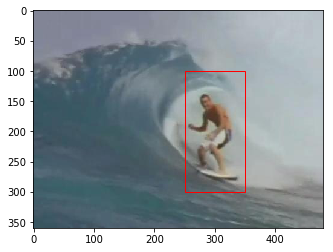

Iteration: 29
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

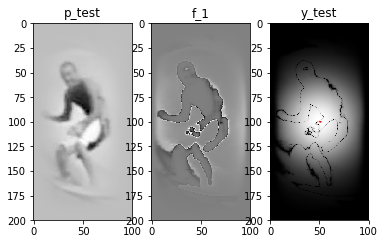

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



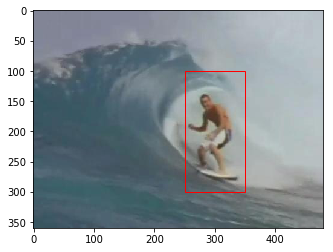

Iteration: 30
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

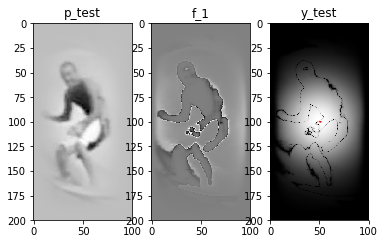

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



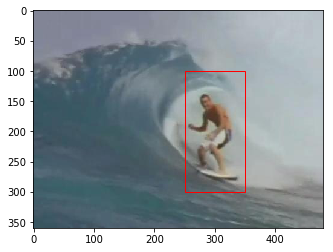

Iteration: 31
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

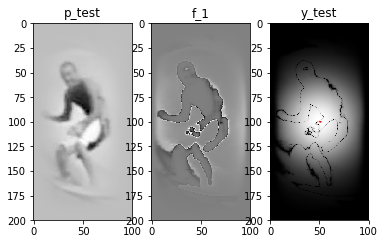

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



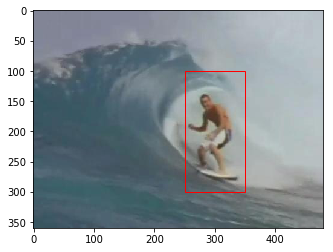

Iteration: 32
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

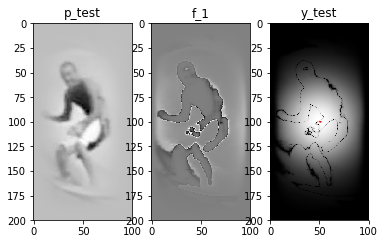

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



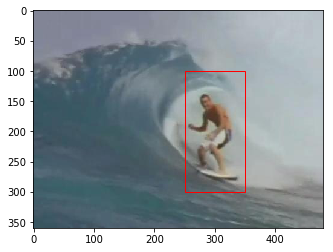

Iteration: 33
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

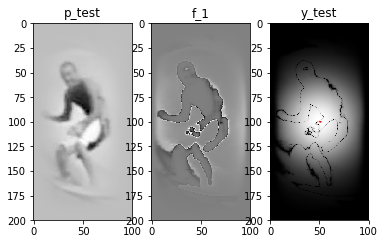

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



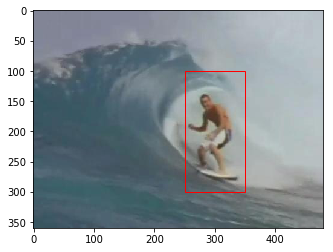

Iteration: 34
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

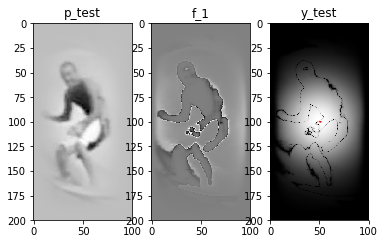

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



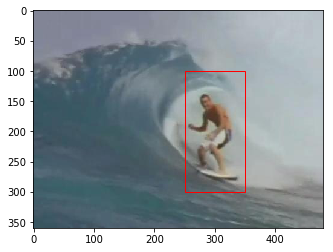

Iteration: 35
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

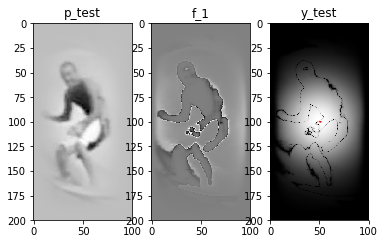

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



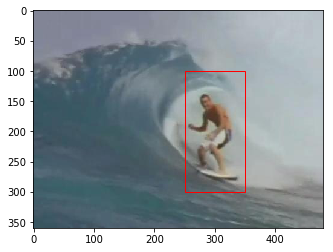

Iteration: 36
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

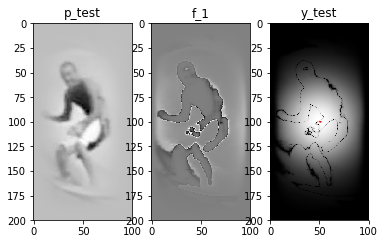

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



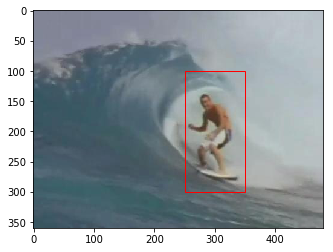

Iteration: 37
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

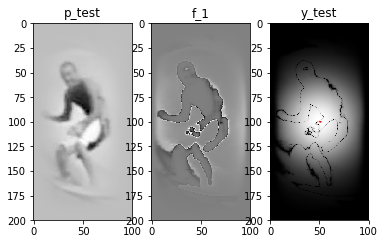

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



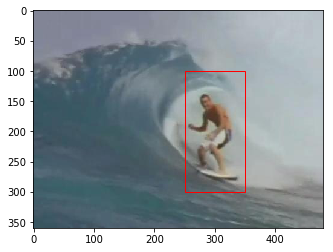

Iteration: 38
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

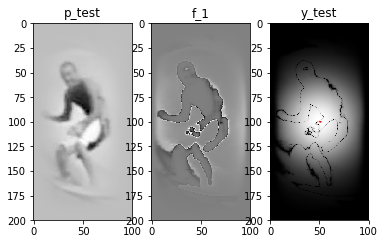

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



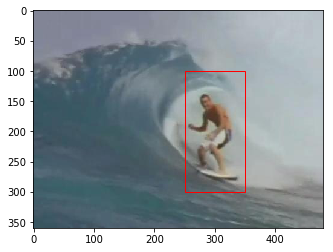

Iteration: 39
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

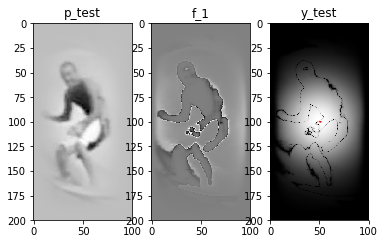

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



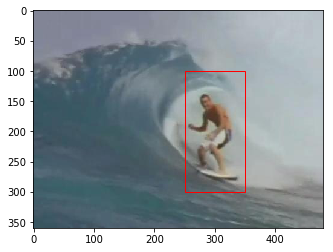

Iteration: 40
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

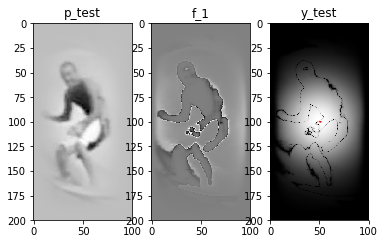

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



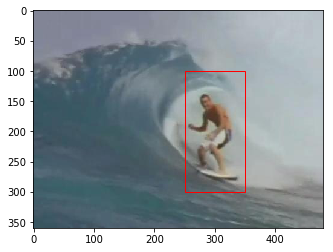

Iteration: 41
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

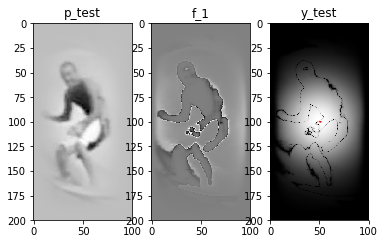

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



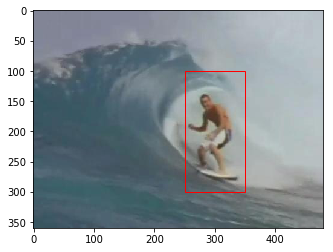

Iteration: 42
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

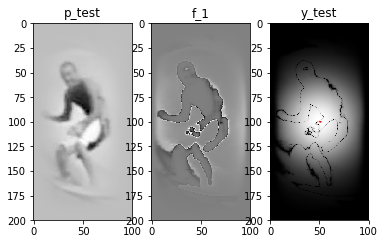

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



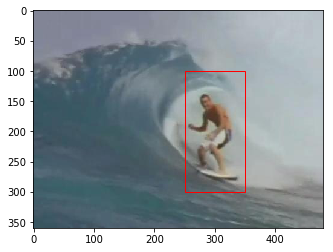

Iteration: 43
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

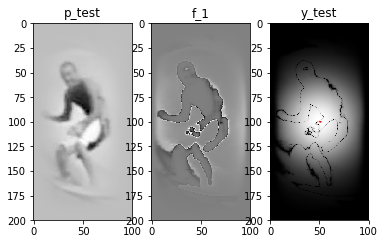

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



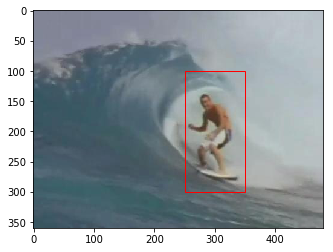

Iteration: 44
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

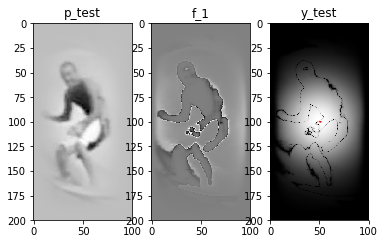

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



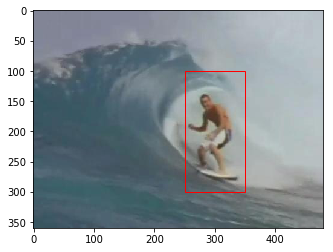

Iteration: 45
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

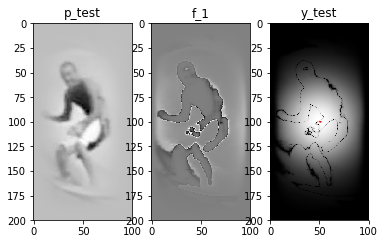

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



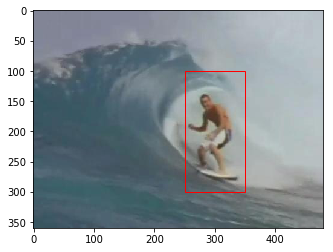

Iteration: 46
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

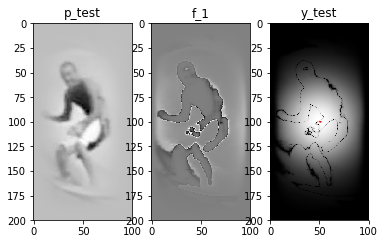

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



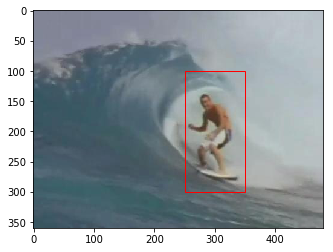

Iteration: 47
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

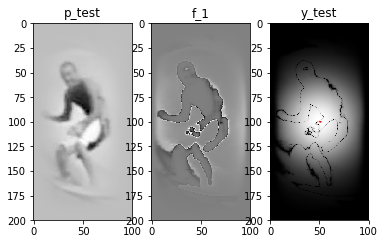

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



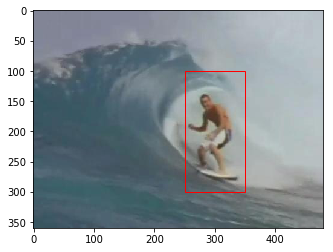

Iteration: 48
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

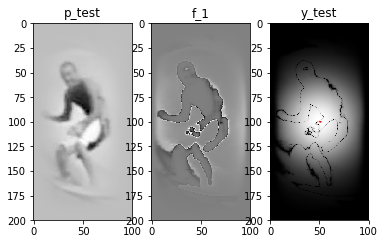

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



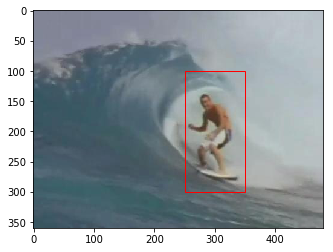

Iteration: 49
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

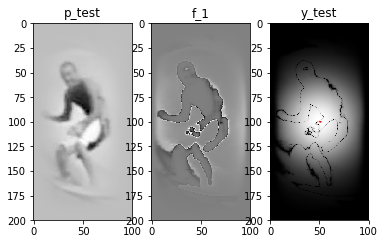

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



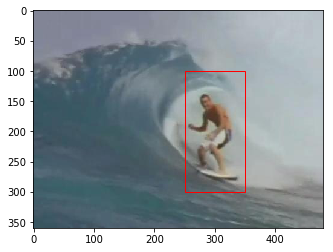

Iteration: 50
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

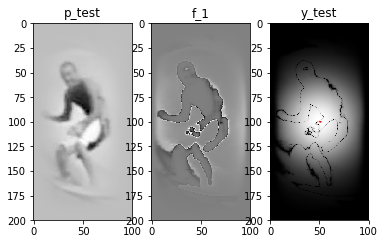

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



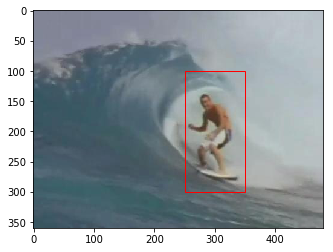

Iteration: 51
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

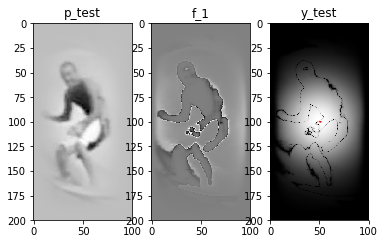

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



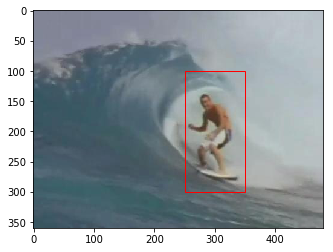

Iteration: 52
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

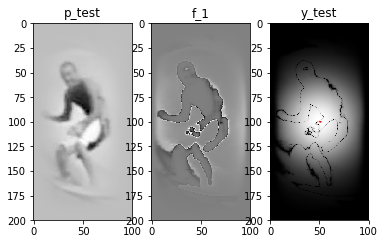

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



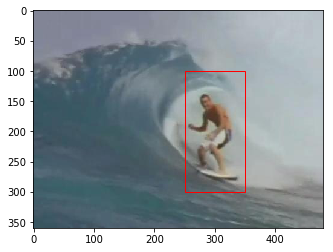

Iteration: 53
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

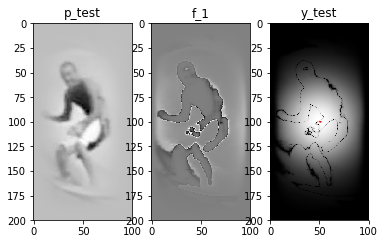

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



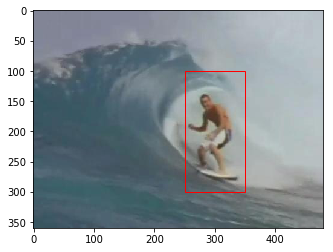

Iteration: 54
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

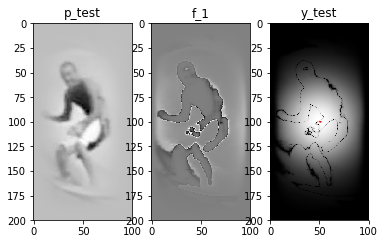

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



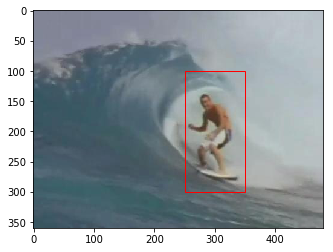

Iteration: 55
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

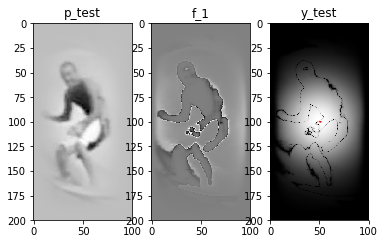

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



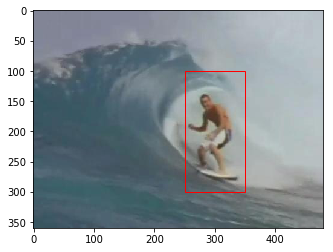

Iteration: 56
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

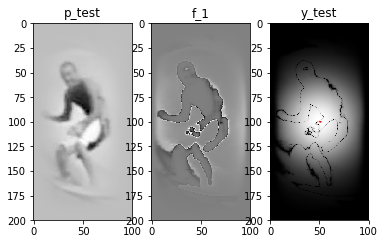

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



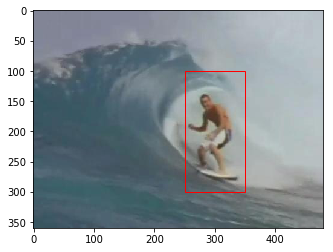

Iteration: 57
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

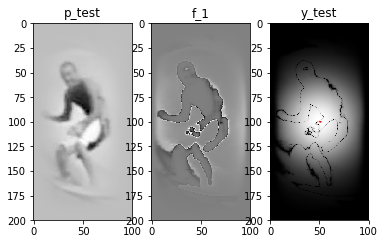

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



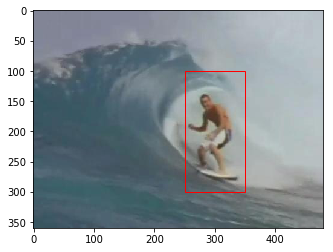

Iteration: 58
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

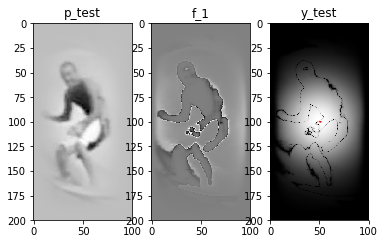

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



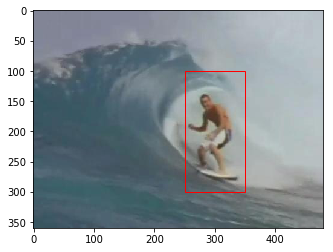

Iteration: 59
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

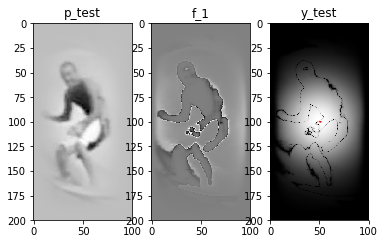

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



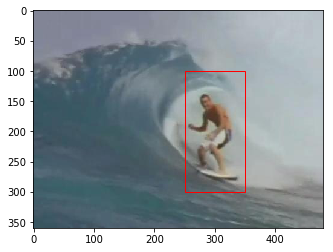

Iteration: 60
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

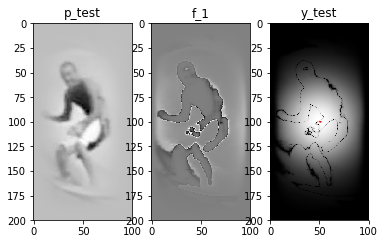

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



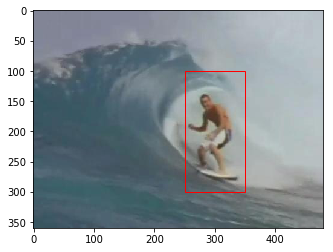

Iteration: 61
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

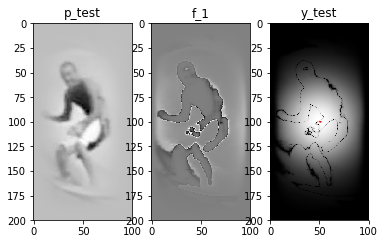

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



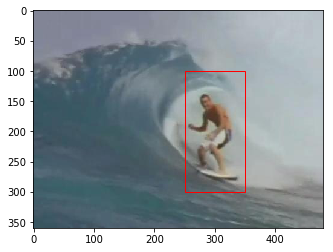

Iteration: 62
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

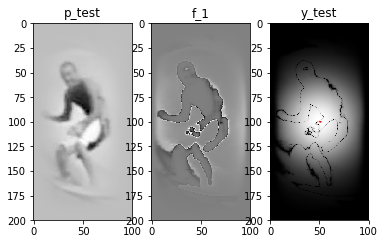

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



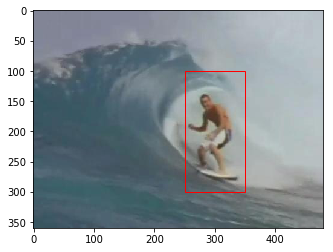

Iteration: 63
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

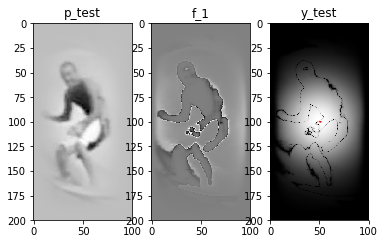

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



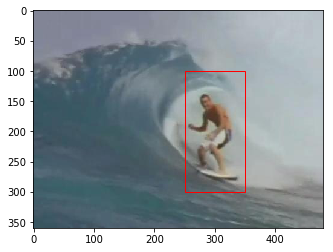

Iteration: 64
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

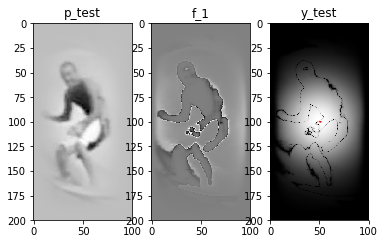

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



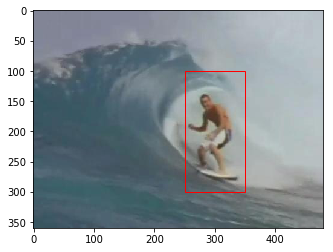

Iteration: 65
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

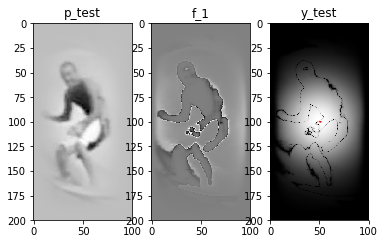

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



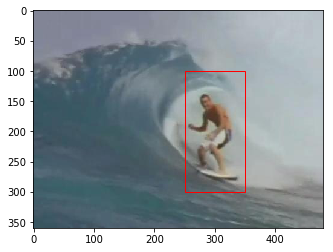

Iteration: 66
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

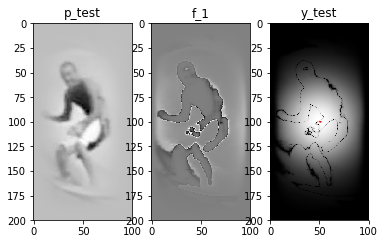

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



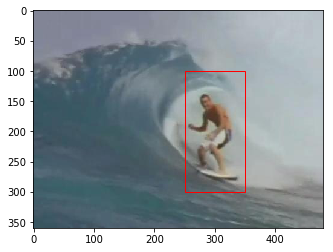

Iteration: 67
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

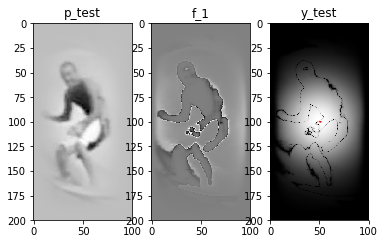

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



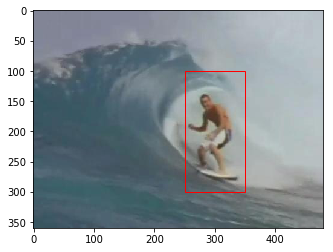

Iteration: 68
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

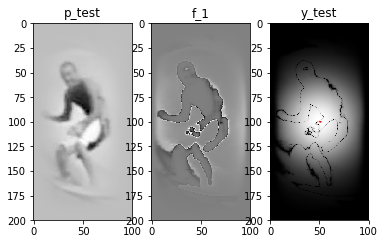

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



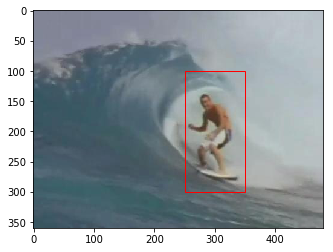

Iteration: 69
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

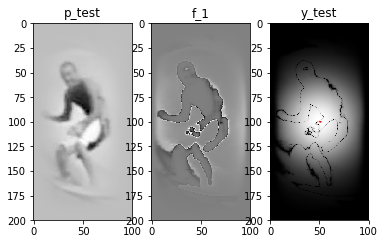

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



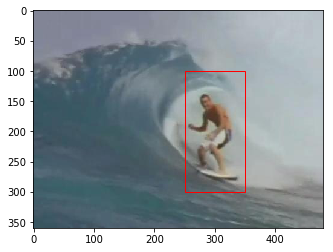

Iteration: 70
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

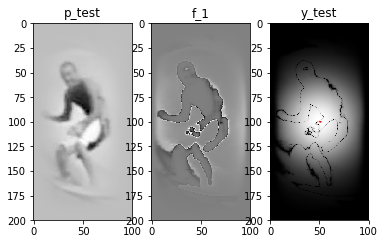

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



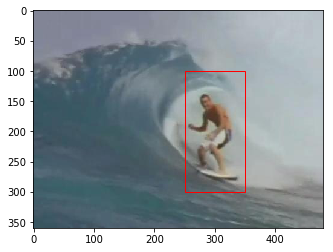

Iteration: 71
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

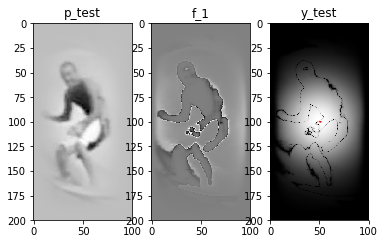

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



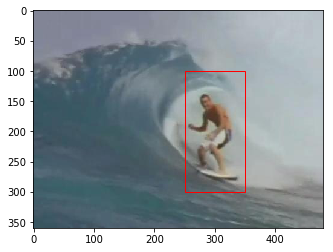

Iteration: 72
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

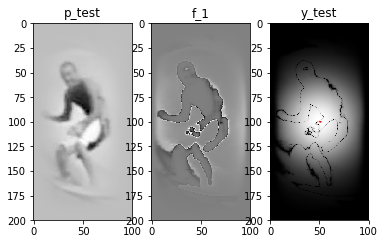

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



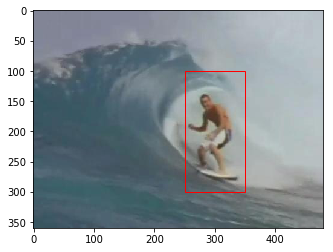

Iteration: 73
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

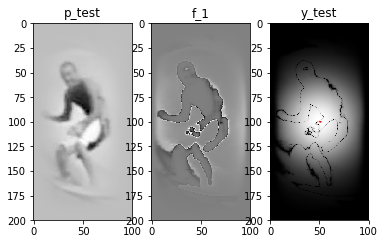

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



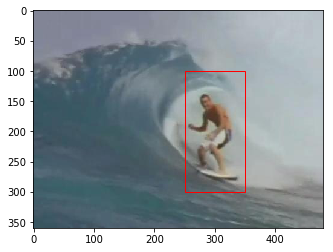

Iteration: 74
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

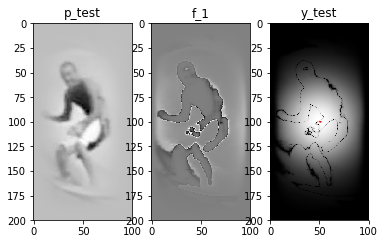

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



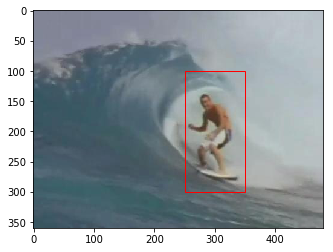

Iteration: 75
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

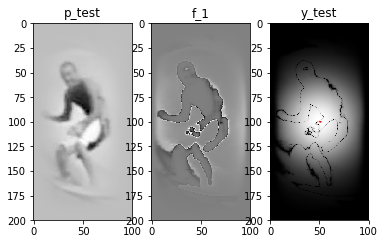

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



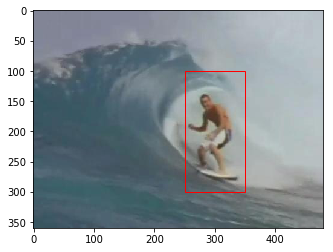

Iteration: 76
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

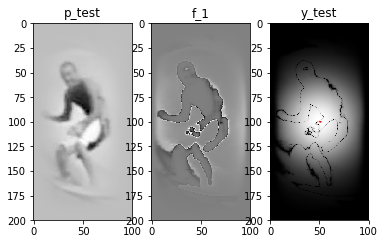

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



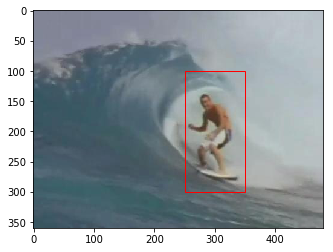

Iteration: 77
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

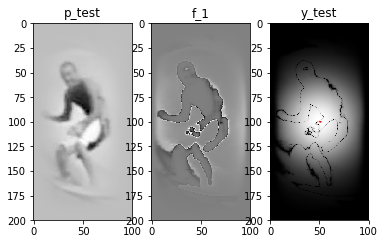

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



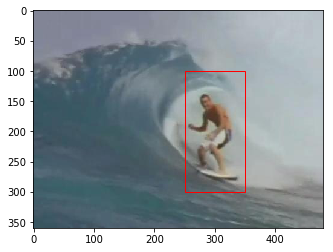

Iteration: 78
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

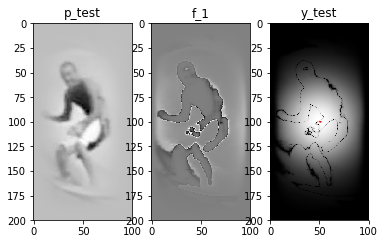

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



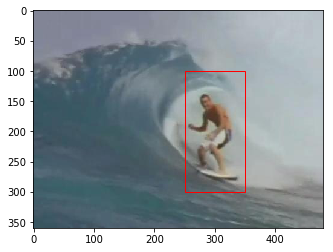

Iteration: 79
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

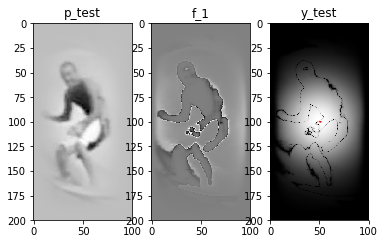

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



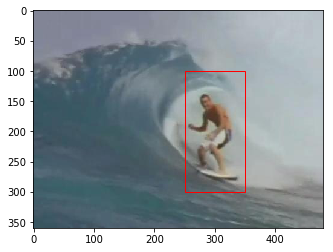

Iteration: 80
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

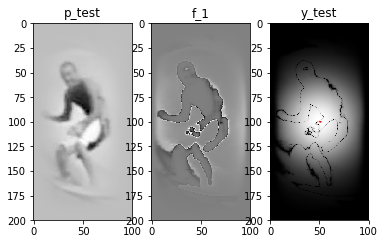

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



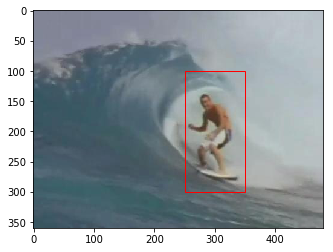

Iteration: 81
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

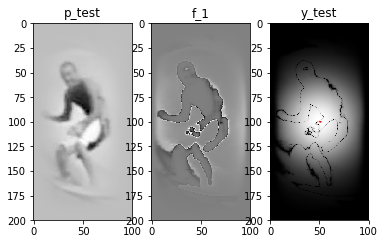

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



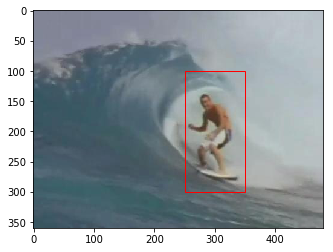

Iteration: 82
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

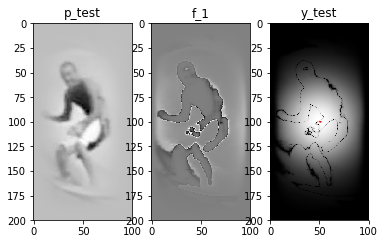

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



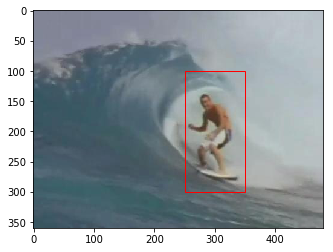

Iteration: 83
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

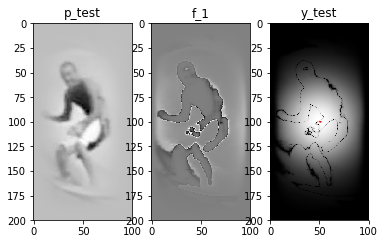

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



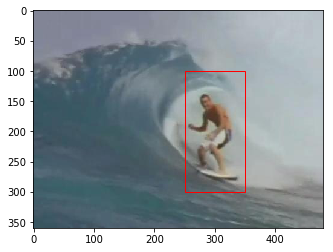

Iteration: 84
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

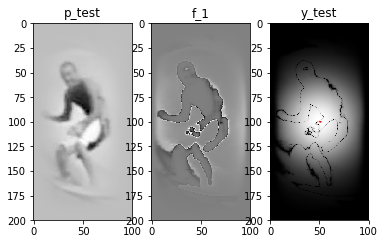

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



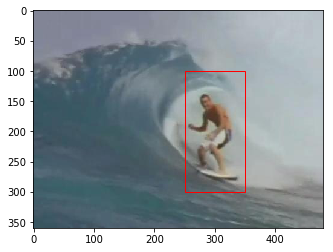

Iteration: 85
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

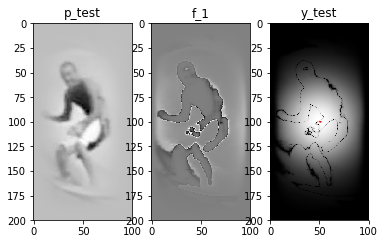

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



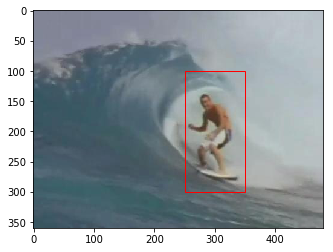

Iteration: 86
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

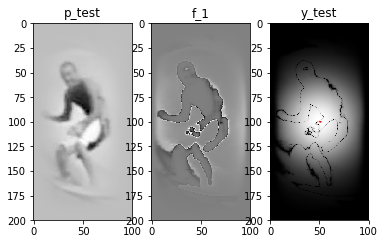

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



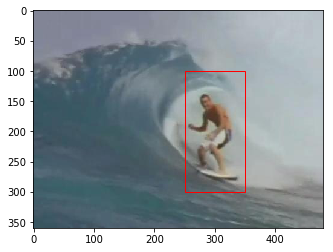

Iteration: 87
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

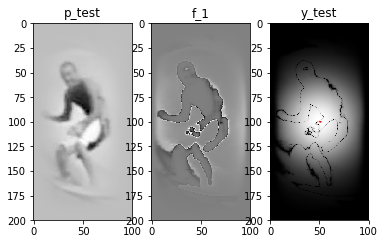

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



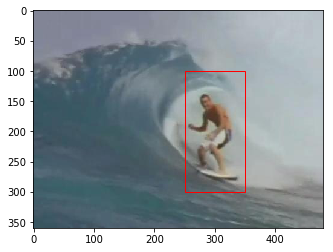

Iteration: 88
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

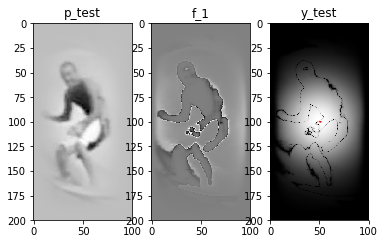

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



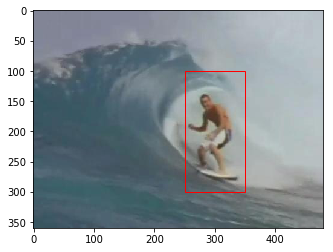

Iteration: 89
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

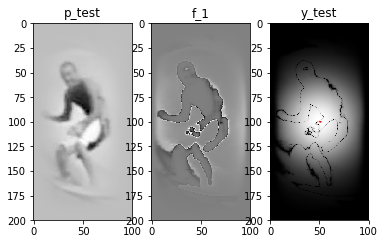

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



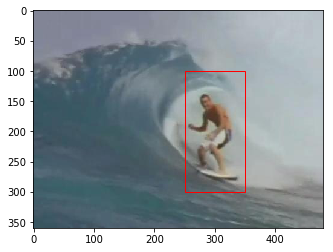

Iteration: 90
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

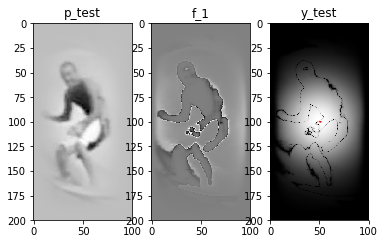

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



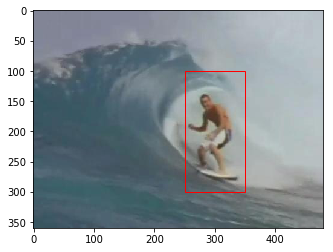

Iteration: 91
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

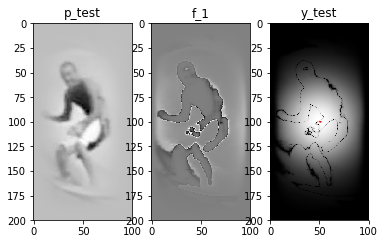

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



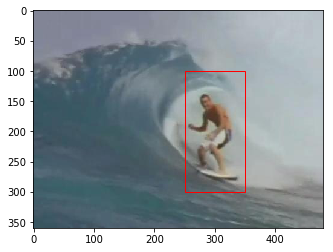

Iteration: 92
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

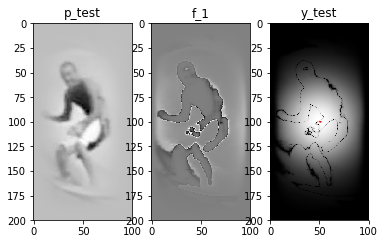

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



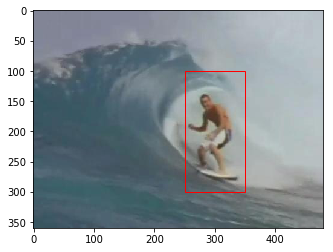

Iteration: 93
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

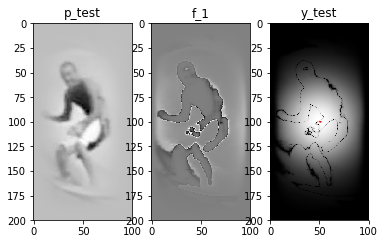

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



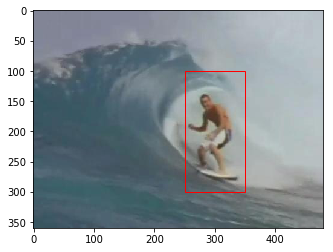

Iteration: 94
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

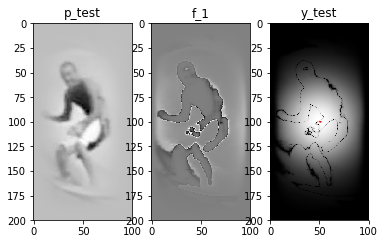

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



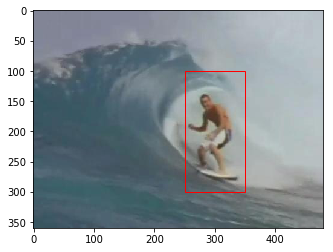

Iteration: 95
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

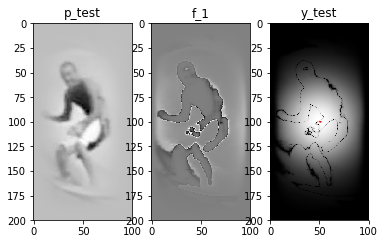

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



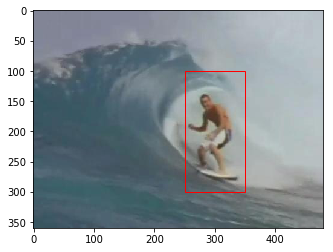

Iteration: 96
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

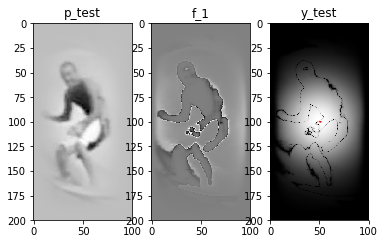

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



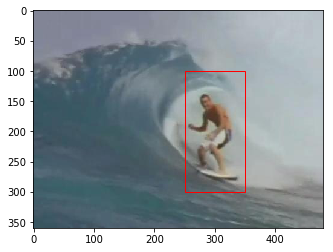

Iteration: 97
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

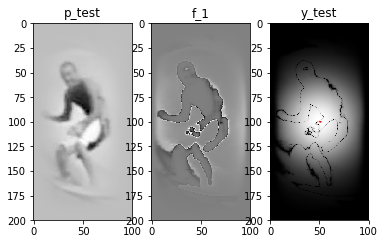

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



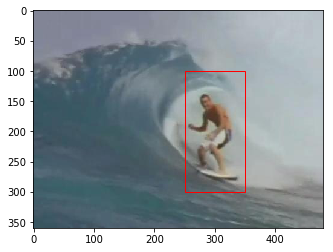

Iteration: 98
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

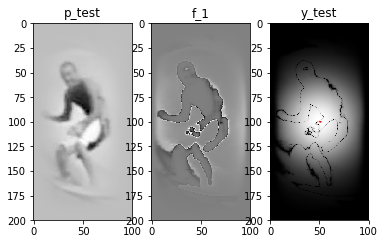

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



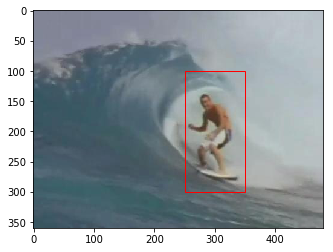

Iteration: 99
Roll: 0, Axis: 1


<Figure size 432x288 with 0 Axes>

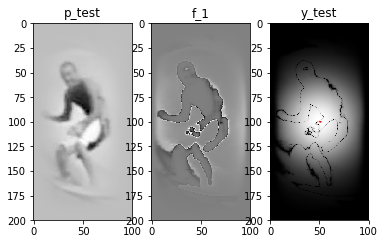

Max_value: 0.00015828492575154432
Max_pos_x: [100]
Max_pos_y: [51]
center_x: 300
center_y: 200
center_x i: 100.0
center_y i: 50.0
dx_i: 0
dy_i: 1
mov_x i: 0
mov_y i: 1



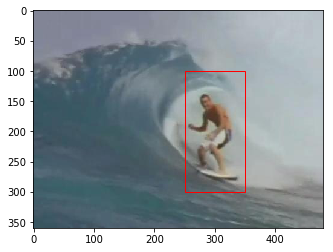

In [98]:
# TEST
def TrainFilter(g, P, l):
    P_conj = np.conjugate(P)
    A = np.fft.fft(g) * P_conj
    B = P * P_conj + l
    return A, B

def OnlineUpdate(A, B, p, Y, n, l):
    P = np.fft.fft(p)
    P_conj = np.conjugate(P)
    A = n * (Y * P) + (1 - n) * A
    B = n * (P * P + l) + (1 - n) * B
    return A, B

def Convolution(p, F):
    I = np.fft.fft(p)
    Y = I * F
    return Y

def getTranslation(y_img):
    max_value = np.max(y_img)
    max_pos = np.where(y_img == max_value)
    dx = int(np.median(max_pos[0]) - y_img.shape[0]/2)
    dy = int(np.median(max_pos[1]) - y_img.shape[1]/2)
    return dx, dy, max_value, max_pos

import matplotlib.patches as patches
center_y_test = 200
center_x_test = 300
n = 0
l = 0.001
A, B = TrainFilter(g_1, P, l)
DX = []
DY = []
PX = []
PY = []
for i in range(100):
    print("Iteration: {0}".format(i))
    roll = -0*i
    axis = 1
    print("Roll: {0}, Axis: {1}".format(roll, axis))
    #img_test = rgb2gray(np.roll(img.copy(), 3*i, axis=0))
    #img_test = np.roll(img_test.copy(), i, axis=1)
    img_test = np.roll(img.copy(), roll, axis=axis)
    
    # Convert image to grayscale
    gray_test = rgb2gray(np.roll(img.copy(), roll, axis=axis))
    
    # Select template
    p_img_test = gray_test[center_y_test-int(height/2):center_y_test+int(height/2),
                          center_x_test-int(width/2):center_x_test+int(width/2)]
    
    # Preprocess
    p_img_test = pre_process(p_img_test)
    
    # Convert to 1-D vector
    p_test = p_img_test.reshape(-1,1)
    
    # Convolution between test image and filter F(y) = F(p) * F_1
    F = A/B
    Y_test = Convolution(p_test, F)
    
    # Inverse fourier transform to get result
    y_test = np.real(np.fft.ifft(Y_test))
    y_test_img = y_test.reshape(p_img_test.shape)
    
    # Get translation
    dx, dy, max_value, max_pos = getTranslation(y_test_img)
    DX.append(dx)
    DY.append(dy)
    
    if True:
        plt.figure()
        f, (ax1, ax2, ax3) = plt.subplots(1,3)
        ax1.imshow(p_img_test, cmap = plt.get_cmap('gray'))
        ax1.set_title("p_test")
        
        f_1 = np.real(np.fft.ifft(np.conjugate(F)))
        #ax2.imshow(f_1.reshape(p_img.shape), cmap = plt.get_cmap('gray'))
        ax2.imshow(f_1.reshape(p_img.shape), cmap = plt.get_cmap('gray'))
        ax2.set_title("f_1")

        ax3.imshow(y_test_img, cmap = plt.get_cmap('gray'))
        ax3.arrow(p_img_test.shape[1]/2, p_img_test.shape[0]/2, dy, dx,
                  head_width=0.05, head_length=1, fc='k', color='red')
        ax3.set_title("y_test")
        plt.show()

    print("Max_value: {0}".format(max_value))
    print("Max_pos_x: {0}".format(max_pos[0]))
    print("Max_pos_y: {0}".format(max_pos[1]))
    print("center_x: {0}".format(center_x_test))
    print("center_y: {0}".format(center_y_test))
    print("center_x i: {0}".format(p_img_test.shape[0]/2))
    print("center_y i: {0}".format(p_img_test.shape[1]/2))
    print("dx_i: {0}".format(dx))
    print("dy_i: {0}".format(dy))
    print("mov_x i: {0}".format(dx))
    print("mov_y i: {0}".format(dy))
    print()
    
    # Update center points of template with momentum
    beta = 0.3
    center_x_test = int(beta * center_x_test + (1 - beta) * (center_x_test + dx))
    center_y_test = int(beta * center_y_test + (1 - beta) * (center_y_test + dy))
    PX.append(center_x_test)
    PY.append(center_y_test)
    
    fig,ax = plt.subplots(1)
    rect = patches.Rectangle((int(center_x_test-width/2),int(center_y_test - height/2)),width,height,linewidth=1,edgecolor='r',facecolor='none')
        
    ax.add_patch(rect)
    ax.imshow(img_test, cmap = plt.get_cmap('gray'))
    plt.show()
    
    # get z
    z_img = gray_test[center_y_test-int(height/2):center_y_test+int(height/2),
                          center_x_test-int(width/2):center_x_test+int(width/2)]
    # Preprocess
    z_test = pre_process(z_img)
    
    # Convert to 1-D vector
    z_test = z_test.reshape(-1,1)
    
    # Online update
    A, B = OnlineUpdate(A, B, z_test, Y_test, n, l)


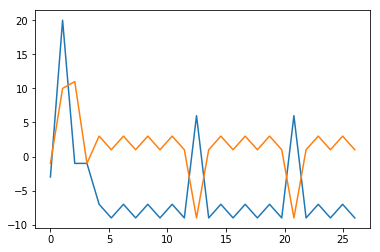

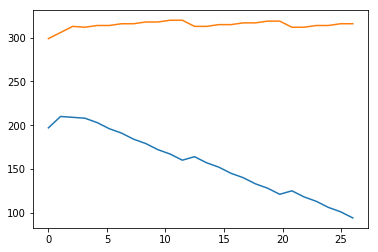

Help on function figure in module matplotlib.pyplot:

figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)
    Creates a new figure.
    
    Parameters
    ----------
    
    num : integer or string, optional, default: none
        If not provided, a new figure will be created, and the figure number
        will be incremented. The figure objects holds this number in a `number`
        attribute.
        If num is provided, and a figure with this id already exists, make
        it active, and returns a reference to it. If this figure does not
        exists, create it and returns it.
        If num is a string, the window title will be set to this figure's
        `num`.
    
    figsize : tuple of integers, optional, default: None
        width, height in inches. If not provided, defaults to rc
        figure.figsize.
    
    dpi : integer, optional, default: None
        resolu

In [77]:
DX = np.array(DX)
t = np.linspace(0, DX.size, DX.size)
DY = np.array(DY)
PX = np.array(PX)
PY = np.array(PY)

plt.figure()
plt.plot(t, DX)
plt.plot(t, DY)
plt.show()

plt.figure()
plt.plot(t, PX)
plt.plot(t, PY)
plt.show()
help(plt.figure)

(200, 100)


C:\tools\Anaconda3\lib\site-packages\skimage\feature\_hog.py:150: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15. To supress this message specify explicitly the normalization method.
  skimage_deprecation)


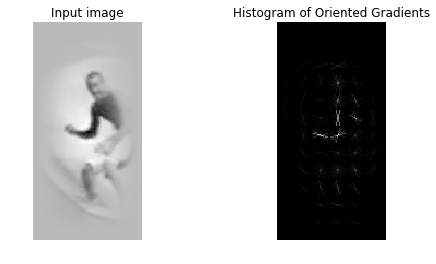

(array([10854], dtype=int64), array([0], dtype=int64))


In [36]:
import matplotlib.pyplot as plt

from skimage.feature import hog
from skimage import data, exposure

image = data.astronaut()
image = p_img_test
print(image.shape)
fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1), visualize=True, multichannel=False)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()



H_I = np.fft.fft(hog_image_rescaled.reshape(-1,1))
P_I = np.fft.fft(p_img_test.reshape(-1,1))

R = H_I * P_I

r = np.real(np.fft.ifft(R))
max_val = np.max(r)
max_pos = np.where(r == max_val)
print(max_pos)

In [29]:
help(hog)

Help on function hog in module skimage.feature._hog:

hog(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(3, 3), block_norm=None, visualize=False, visualise=None, transform_sqrt=False, feature_vector=True, multichannel=None)
    Extract Histogram of Oriented Gradients (HOG) for a given image.
    
    Compute a Histogram of Oriented Gradients (HOG) by
    
        1. (optional) global image normalization
        2. computing the gradient image in `row` and `col`
        3. computing gradient histograms
        4. normalizing across blocks
        5. flattening into a feature vector
    
    Parameters
    ----------
    image : (M, N[, C]) ndarray
        Input image.
    orientations : int, optional
        Number of orientation bins.
    pixels_per_cell : 2-tuple (int, int), optional
        Size (in pixels) of a cell.
    cells_per_block : 2-tuple (int, int), optional
        Number of cells in each block.
    block_norm : str {'L1', 'L1-sqrt', 'L2', 'L2-Hys'}, optio